In [1]:
import prior

dataset = prior.load_dataset("procthor-10k")
dataset

Fetching reference HEAD


[AI2-THOR WARNING] There has been an update to ProcTHOR-10K that must be used with AI2-THOR version 5.0+. To use the new version of ProcTHOR-10K, please update AI2-THOR to version 5.0+ by running:
    pip install --upgrade ai2thor
Alternatively, to downgrade to the old version of ProcTHOR-10K, run:
   prior.load_dataset("procthor-10k", revision="ab3cacd0fc17754d4c080a3fd50b18395fae8647")


Loading test: 100%|██████████| 1000/1000 [00:00<00:00, 24702.31it/s]


DatasetDict(
    train=Dataset(
    dataset=procthor-dataset,
    size=10000,
    split=train
),
    val=Dataset(
    dataset=procthor-dataset,
    size=1000,
    split=val
),
    test=Dataset(
    dataset=procthor-dataset,
    size=1000,
    split=test
)
)

In [18]:
from ai2thor.controller import Controller
import numpy as np

house = dataset["train"][np.random.randint(0, 10000, (1,))[0]]
controller = Controller(scene=house, snapToGrid=False, rotateStepDegrees=30)
event = controller.step("Pass")
spawn = event.metadata["agent"]["position"]

In [17]:
controller.stop()

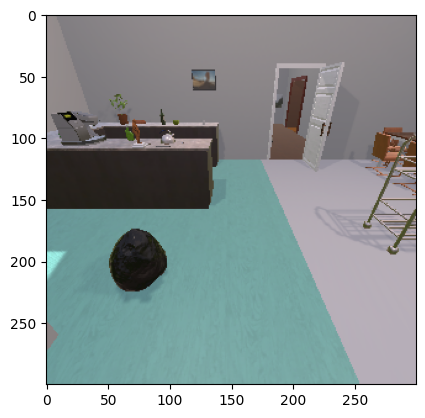

In [3]:
import matplotlib.pyplot as plt
event = controller.step("MoveAhead")
plt.imshow(event.frame)

In [4]:
event.metadata["agent"]["position"]

{'x': 3.5, 'y': 0.9009997844696045, 'z': 5.0}

In [3]:
from rl import PPO, ActorCritic, Env, RolloutBuffer, ClipEnv, CLIPNovelty, load_actor_critic
from models import LSTMActor, LSTMCritic, FrozenResNetEncoder, SlidingWindowTransformerActor, SlidingWindowTransformerCritic
from cons import MINIBATCHES, EPISODE_STEPS, FEAT_DIM, NUM_ACTIONS, DEVICE

In [4]:
ENTROPY_COEF = 0.05

ppo = PPO(ENTROPY_COEF)
encoder = FrozenResNetEncoder()
actor = SlidingWindowTransformerActor(FEAT_DIM, NUM_ACTIONS)
critic = SlidingWindowTransformerCritic(FEAT_DIM)
clip_novelty = CLIPNovelty()
clip_env = ClipEnv(clip_novelty)
clip_actor_critic = ActorCritic(encoder, actor, critic)


In [7]:
from torchinfo import summary

summary(clip_actor_critic.actor), summary(clip_actor_critic.critic), summary(clip_actor_critic.actor_critic_encoder)

(==========================================================================================
 Layer (type:depth-idx)                                            Param #
 SlidingWindowTransformerActor                                     8,192
 ├─TransformerEncoder: 1-1                                         --
 │    └─ModuleList: 2-1                                            --
 │    │    └─TransformerEncoderLayer: 3-1                          789,760
 │    │    └─TransformerEncoderLayer: 3-2                          789,760
 │    │    └─TransformerEncoderLayer: 3-3                          789,760
 │    │    └─TransformerEncoderLayer: 3-4                          789,760
 ├─Linear: 1-2                                                     771
 Total params: 3,168,003
 Trainable params: 3,168,003
 Non-trainable params: 0
 ==========================================================================================,
 Layer (type:depth-idx)                                            Param #
 S

In [10]:
load_actor_critic(clip_actor_critic, "data/multi_env/weight.pt", device=DEVICE)

[🔁] Actor-Critic checkpoint loaded from data/multi_env/weight.pt


{'x': 3.25, 'y': 0.9009993672370911, 'z': 6.25}


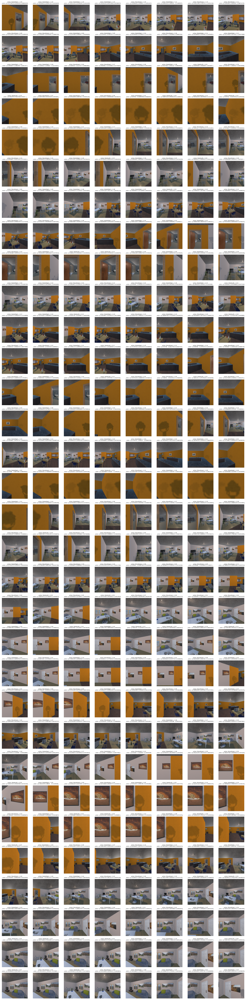

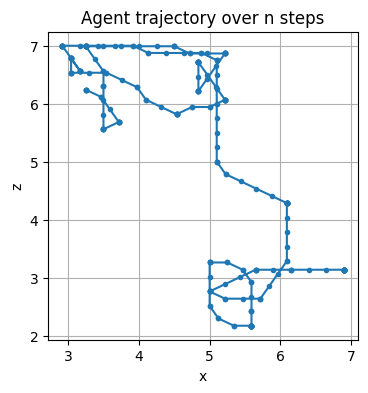

[tensor([[[0.2706, 0.2824, 0.2902,  ..., 0.2863, 0.3098, 0.3098],
          [0.2667, 0.2706, 0.2745,  ..., 0.2980, 0.3020, 0.3059],
          [0.2784, 0.2784, 0.2706,  ..., 0.3098, 0.2980, 0.2980],
          ...,
          [0.1098, 0.1098, 0.1098,  ..., 0.3765, 0.3765, 0.3765],
          [0.1098, 0.1098, 0.1098,  ..., 0.3765, 0.3765, 0.3804],
          [0.1098, 0.1098, 0.1098,  ..., 0.3765, 0.3804, 0.3765]],
 
         [[0.2667, 0.2784, 0.2863,  ..., 0.2824, 0.3020, 0.3020],
          [0.2627, 0.2667, 0.2667,  ..., 0.2902, 0.2941, 0.2980],
          [0.2745, 0.2745, 0.2627,  ..., 0.2980, 0.2941, 0.2941],
          ...,
          [0.0980, 0.1020, 0.0980,  ..., 0.3725, 0.3725, 0.3725],
          [0.0980, 0.1020, 0.1020,  ..., 0.3725, 0.3765, 0.3765],
          [0.0980, 0.1020, 0.1020,  ..., 0.3725, 0.3725, 0.3725]],
 
         [[0.2627, 0.2784, 0.2863,  ..., 0.2784, 0.2980, 0.2980],
          [0.2588, 0.2667, 0.2627,  ..., 0.2902, 0.2902, 0.2941],
          [0.2745, 0.2745, 0.2588,  ...,

In [19]:
from rl import PPO, inference, inference_video_mp4, teleport
import torch

def get_distributions(ppo: PPO, obs_seq, actions_tensor, clip_actor_critic):
    logits, value = ppo.act_and_value(obs_seq, actions_tensor, clip_actor_critic)
    dist = torch.distributions.Categorical(logits=logits)
    # dist = torch.distributions.Categorical(probs=torch.tensor([0.5,0.25,0.25]))
    return dist


point = teleport(controller).metadata["agent"]["position"]
print(point)
inference(get_distributions, controller, ppo=PPO(0.08), init_position=point, env=clip_env, actor_critic=clip_actor_critic)

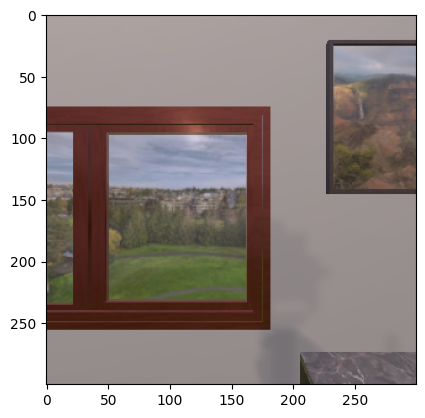

In [258]:
# teleport(controller, trapped)
event = controller.step("MoveAhead")
plt.imshow(event.frame)

In [259]:
event.metadata["agent"]["position"]

{'x': 5.6405439376831055, 'y': 0.9009993672370911, 'z': 7.591506481170654}

In [11]:
controller.stop()